In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=835a82b7b831c0b8a636b44e2114c292c5eba6d566608dc3c1578b39a338aa68
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
# ==== Imports ====
import pandas as pd
import numpy as np
import shap
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [ ]:
# ==== Load Dataset ====
df = pd.read_csv("/content/emotions.csv")  # Replace with your path if needed
X = df.drop(columns=["label"])
y = df["label"]

In [ ]:
# ==== Encode Labels ====
le = LabelEncoder()
y_encoded = le.fit_transform(y)

from sklearn.preprocessing import LabelEncoder

# Encode string labels to integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(df['label'])  # replace 'label' with your target column name


# ==== Split and Scale ====
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)


In [ ]:


# ==== Define Model ====
class BrainXAI_Net(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(BrainXAI_Net, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        return self.fc2(x)

# Instantiate and train model
model = BrainXAI_Net(input_dim=X.shape[1], hidden_dim=64, output_dim=len(np.unique(y_encoded)))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(20):
    model.train()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

In [ ]:

# ==== Define Model Wrapper for SHAP ====
def model_predict(x_numpy):
    x_tensor = torch.tensor(x_numpy, dtype=torch.float32)
    with torch.no_grad():
        logits = model(x_tensor)
        return torch.nn.functional.softmax(logits, dim=1).numpy()



In [ ]:
import lime
import lime.lime_tabular
import numpy as np
import torch

# Define prediction function (for numpy input)
def model_predict(x_numpy):
    x_tensor = torch.tensor(x_numpy, dtype=torch.float32)
    with torch.no_grad():
        logits = model(x_tensor)
        probs = torch.nn.functional.softmax(logits, dim=1)
    return probs.numpy()

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=label_encoder.classes_,
    mode='classification'
)

# Pick one test instance
i = 0  # change index to explain other instances
instance = X_test_scaled[i]

# Generate explanation
exp = explainer.explain_instance(instance, model_predict, num_features=10)

# Show explanation in notebook
exp.show_in_notebook(show_table=True)


 LIME explanation for test sample #0
NEGATIVE: 0.00
NEUTRAL: 0.10
POSITIVE: 0.90


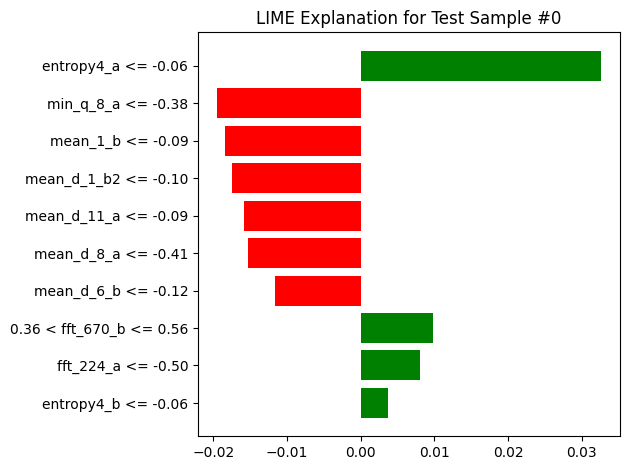

 LIME explanation for test sample #1
NEGATIVE: 0.99
NEUTRAL: 0.00
POSITIVE: 0.01


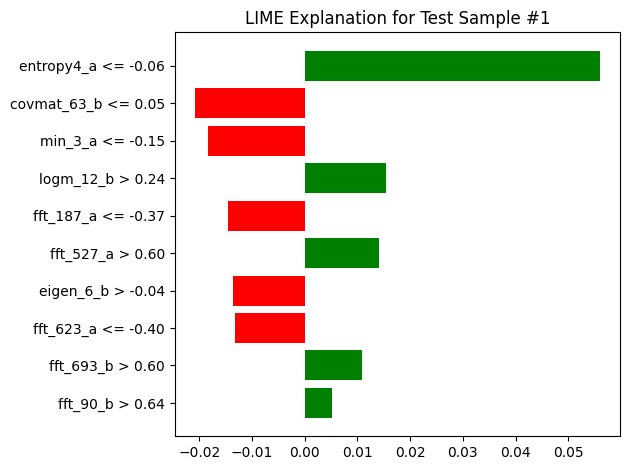

 LIME explanation for test sample #2
NEGATIVE: 0.97
NEUTRAL: 0.00
POSITIVE: 0.03


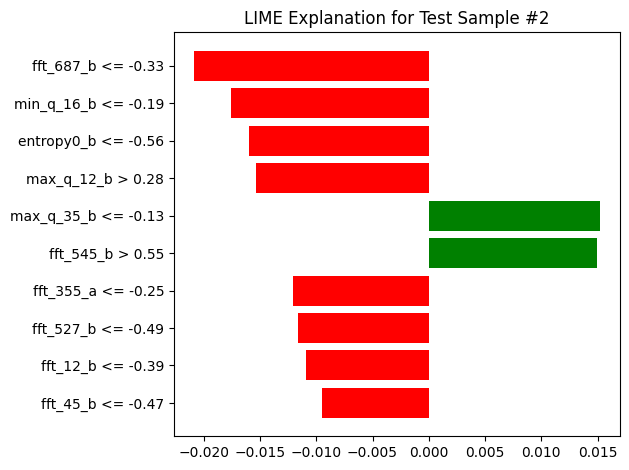

 LIME explanation for test sample #3
NEGATIVE: 0.00
NEUTRAL: 1.00
POSITIVE: 0.00


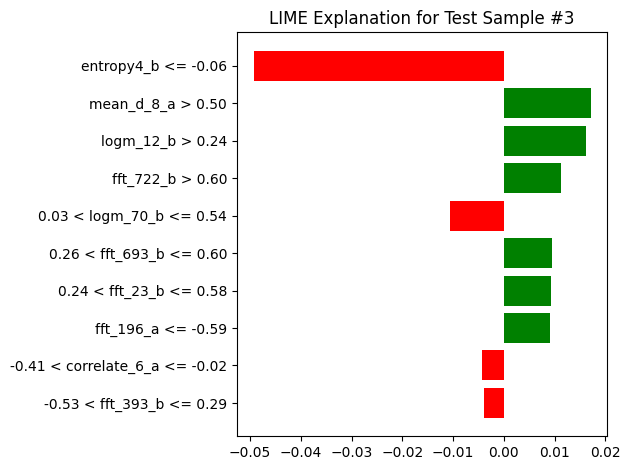

 LIME explanation for test sample #4
NEGATIVE: 0.99
NEUTRAL: 0.00
POSITIVE: 0.01


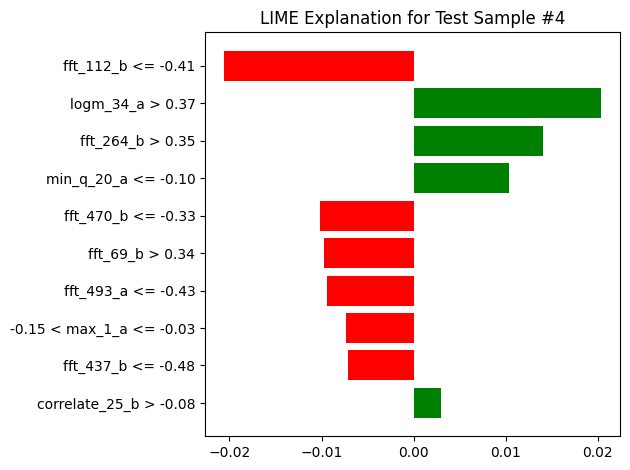

In [ ]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Number of test samples you want to explain
n_samples = 5

# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=X.columns.tolist(),
    class_names=label_encoder.classes_,
    mode='classification'
)

# Loop over multiple test samples
for i in range(n_samples):
    print(f" LIME explanation for test sample #{i}")

    # Get one test instance
    sample = X_test_scaled[i]

    # Get model prediction explanation
    exp = explainer.explain_instance(
        data_row=sample,
        predict_fn=model_predict,
        num_features=10
    )

    # Show prediction details
    pred_probs = model_predict(sample.reshape(1, -1))[0]
    for class_idx, class_name in enumerate(label_encoder.classes_):
        print(f"{class_name}: {pred_probs[class_idx]:.2f}")

    # Show explanation
    exp.show_in_notebook(show_table=True)

    # Optional: Save as image
    fig = exp.as_pyplot_figure()
    plt.title(f"LIME Explanation for Test Sample #{i}")
    plt.tight_layout()
    plt.savefig(f"lime_explanation_sample_{i}.png")
    plt.show()


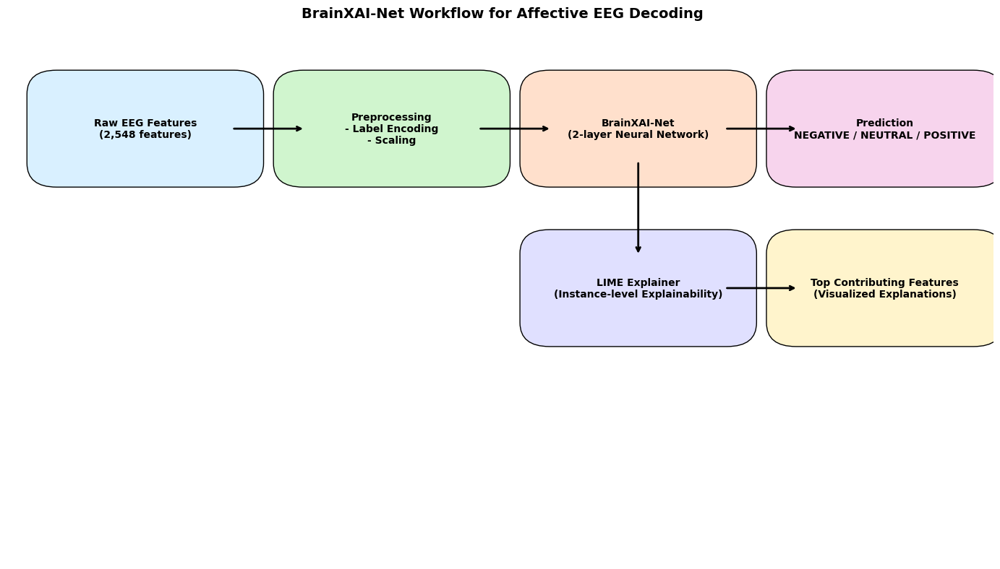

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, ConnectionPatch

# Set up figure and axis
fig, ax = plt.subplots(figsize=(14, 8))
ax.axis('off')

# Define boxes with positions and labels
boxes = [
    {'xy': (0.05, 0.75), 'text': 'Raw EEG Features\n(2,548 features)', 'color': '#d9f0ff'},
    {'xy': (0.30, 0.75), 'text': 'Preprocessing\n- Label Encoding\n- Scaling', 'color': '#d0f5ce'},
    {'xy': (0.55, 0.75), 'text': 'BrainXAI-Net\n(2-layer Neural Network)', 'color': '#ffe0cc'},
    {'xy': (0.80, 0.75), 'text': 'Prediction\nNEGATIVE / NEUTRAL / POSITIVE', 'color': '#f7d4ed'},
    {'xy': (0.55, 0.45), 'text': 'LIME Explainer\n(Instance-level Explainability)', 'color': '#e0e0ff'},
    {'xy': (0.80, 0.45), 'text': 'Top Contributing Features\n(Visualized Explanations)', 'color': '#fff4cc'}
]

# Draw all boxes
for box in boxes:
    rect = FancyBboxPatch(box['xy'], 0.18, 0.13,
                          boxstyle="round,pad=0.03", ec="black", fc=box['color'], mutation_aspect=1.5)
    ax.add_patch(rect)
    ax.text(box['xy'][0] + 0.09, box['xy'][1] + 0.065, box['text'],
            fontsize=10, va='center', ha='center', weight='bold')

# Draw horizontal arrows (pipeline)
arrow_props = dict(arrowstyle='->', lw=2, color='black')
for i in range(3):
    start = (boxes[i]['xy'][0] + 0.18, boxes[i]['xy'][1] + 0.065)
    end = (boxes[i+1]['xy'][0], boxes[i+1]['xy'][1] + 0.065)
    arrow = ConnectionPatch(start, end, "data", "data", **arrow_props)
    ax.add_patch(arrow)

# Draw vertical arrows from BrainXAI-Net to LIME and to output
lime_start = (boxes[2]['xy'][0] + 0.09, boxes[2]['xy'][1])
lime_end = (boxes[4]['xy'][0] + 0.09, boxes[4]['xy'][1] + 0.13)
arrow_lime = ConnectionPatch(lime_start, lime_end, "data", "data", **arrow_props)
ax.add_patch(arrow_lime)

lime_output_start = (boxes[4]['xy'][0] + 0.18, boxes[4]['xy'][1] + 0.065)
lime_output_end = (boxes[5]['xy'][0], boxes[5]['xy'][1] + 0.065)
arrow_out = ConnectionPatch(lime_output_start, lime_output_end, "data", "data", **arrow_props)
ax.add_patch(arrow_out)

# Title
plt.suptitle("BrainXAI-Net Workflow for Affective EEG Decoding", fontsize=14, weight='bold')

plt.tight_layout()
plt.show()



=== Classification Report ===
              precision    recall  f1-score   support

    NEGATIVE       0.88      0.99      0.93       142
     NEUTRAL       0.99      0.99      0.99       143
    POSITIVE       0.97      0.85      0.91       142

    accuracy                           0.94       427
   macro avg       0.95      0.94      0.94       427
weighted avg       0.95      0.94      0.94       427


Test Accuracy: 94.15%


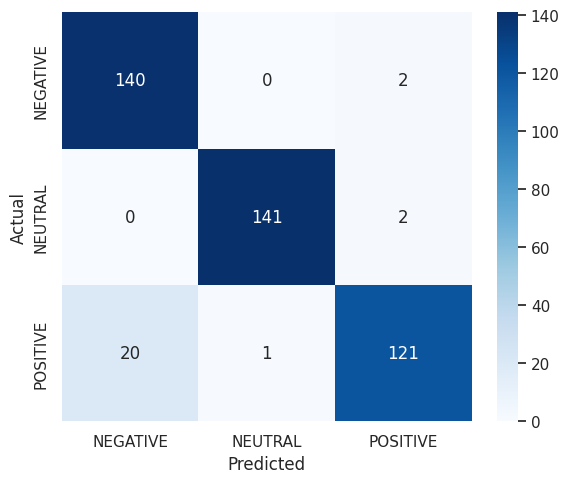

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns

# ==== Prepare Test Data ====
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

# ==== Predict on Test Set ====
model.eval()
with torch.no_grad():
    logits = model(X_test_tensor)
    predictions = torch.argmax(logits, dim=1).numpy()

# ==== Evaluation Metrics ====
y_true = y_test
y_pred = predictions

# Classification Report
print("\n=== Classification Report ===")
print(classification_report(y_true, y_pred, target_names=label_encoder.classes_))

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"\nTest Accuracy: {accuracy * 100:.2f}%")

# ==== Confusion Matrix ====
conf_mat = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.title("")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()


In [ ]:
losses = []

for epoch in range(20):
    model.train()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    losses.append(loss.item())
    print(f"Epoch {epoch+1}/20, Loss: {loss.item():.4f}")


Epoch 1/20, Loss: 0.1133
Epoch 2/20, Loss: 0.1071
Epoch 3/20, Loss: 0.0989
Epoch 4/20, Loss: 0.0923
Epoch 5/20, Loss: 0.0885
Epoch 6/20, Loss: 0.0865
Epoch 7/20, Loss: 0.0845
Epoch 8/20, Loss: 0.0813
Epoch 9/20, Loss: 0.0767
Epoch 10/20, Loss: 0.0720
Epoch 11/20, Loss: 0.0684
Epoch 12/20, Loss: 0.0661
Epoch 13/20, Loss: 0.0643
Epoch 14/20, Loss: 0.0622
Epoch 15/20, Loss: 0.0594
Epoch 16/20, Loss: 0.0563
Epoch 17/20, Loss: 0.0537
Epoch 18/20, Loss: 0.0517
Epoch 19/20, Loss: 0.0501
Epoch 20/20, Loss: 0.0484


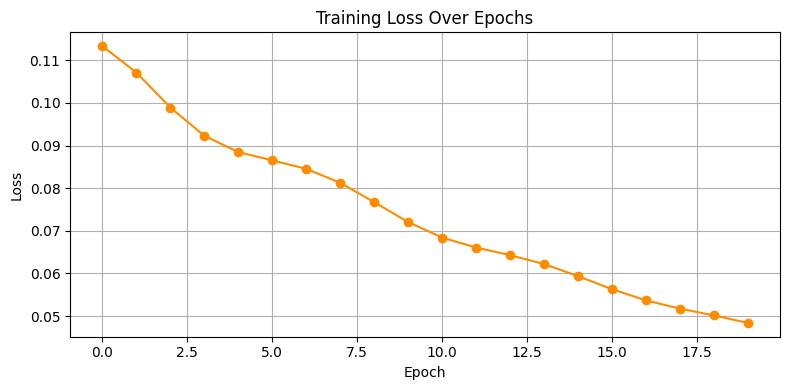

In [ ]:
plt.figure(figsize=(8, 4))
plt.plot(losses, marker='o', color='darkorange')
plt.title("Training Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.tight_layout()
plt.show()


Epoch 1/20, Train Loss: 0.0313, Val Loss: 0.0261
Epoch 2/20, Train Loss: 0.0301, Val Loss: 0.0253
Epoch 3/20, Train Loss: 0.0287, Val Loss: 0.0245
Epoch 4/20, Train Loss: 0.0273, Val Loss: 0.0238
Epoch 5/20, Train Loss: 0.0259, Val Loss: 0.0233
Epoch 6/20, Train Loss: 0.0246, Val Loss: 0.0230
Epoch 7/20, Train Loss: 0.0235, Val Loss: 0.0227
Epoch 8/20, Train Loss: 0.0224, Val Loss: 0.0224
Epoch 9/20, Train Loss: 0.0215, Val Loss: 0.0220
Epoch 10/20, Train Loss: 0.0205, Val Loss: 0.0216
Epoch 11/20, Train Loss: 0.0196, Val Loss: 0.0212
Epoch 12/20, Train Loss: 0.0187, Val Loss: 0.0208
Epoch 13/20, Train Loss: 0.0179, Val Loss: 0.0206
Epoch 14/20, Train Loss: 0.0171, Val Loss: 0.0203
Epoch 15/20, Train Loss: 0.0164, Val Loss: 0.0200
Epoch 16/20, Train Loss: 0.0157, Val Loss: 0.0197
Epoch 17/20, Train Loss: 0.0150, Val Loss: 0.0194
Epoch 18/20, Train Loss: 0.0144, Val Loss: 0.0191
Epoch 19/20, Train Loss: 0.0138, Val Loss: 0.0189
Epoch 20/20, Train Loss: 0.0133, Val Loss: 0.0187


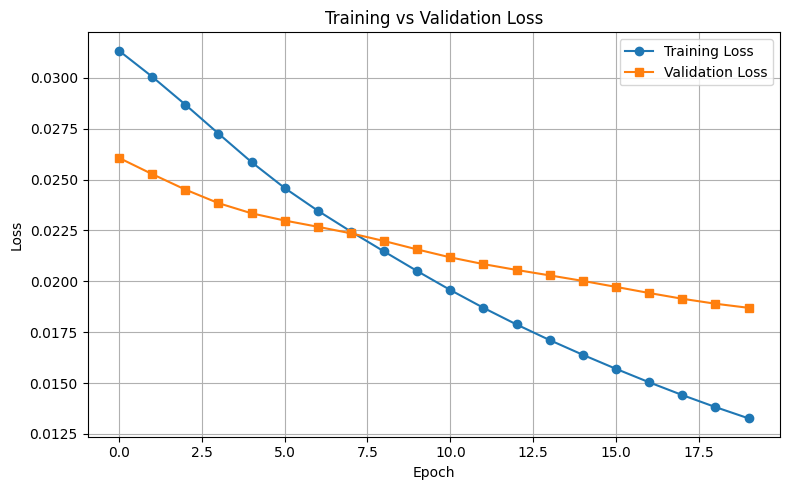

In [ ]:
# ==== Setup ====
from sklearn.model_selection import train_test_split

# Split into training and validation sets
X_train_scaled, X_val_scaled, y_train, y_val = train_test_split(
    X_train_scaled, y_train, test_size=0.2, random_state=42, stratify=y_train
)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

X_val_tensor = torch.tensor(X_val_scaled, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# ==== Training Loop with Validation ====
train_losses = []
val_losses = []

for epoch in range(20):
    # Training
    model.train()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())

    # Validation
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, y_val_tensor)
        val_losses.append(val_loss.item())

    print(f"Epoch {epoch+1}/20, Train Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}")

# ==== Plot Training and Validation Loss ====
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Training Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='s')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


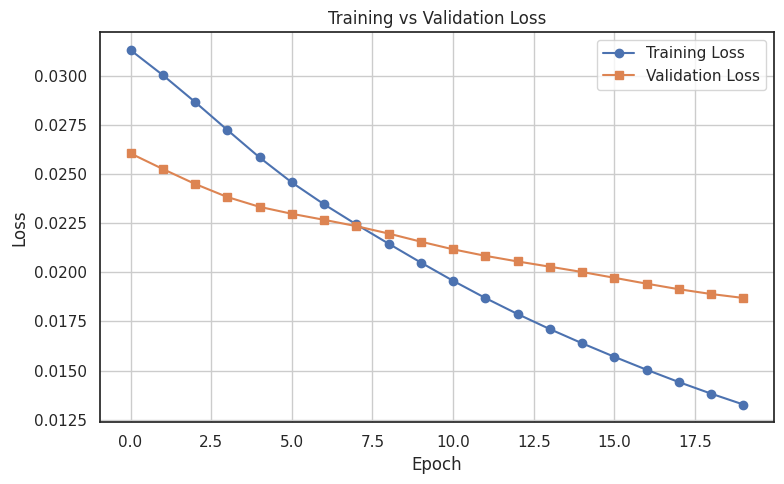

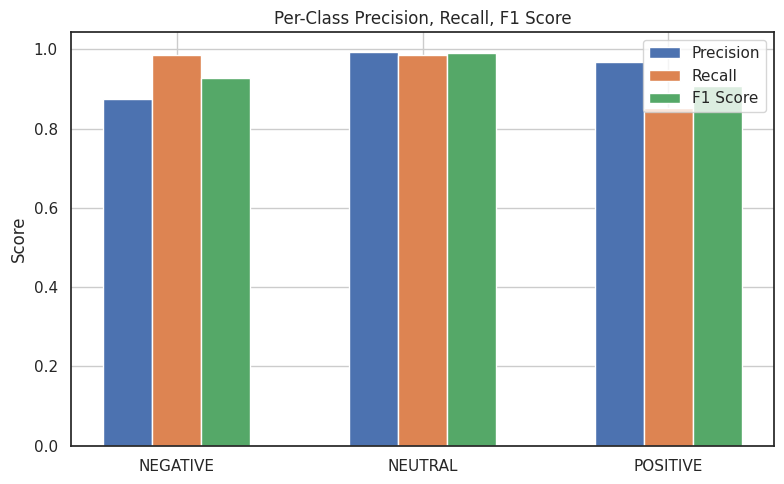

ValueError: Found input variables with inconsistent numbers of samples: [427, 500]

In [ ]:
# Assuming you store both training and validation loss per epoch
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Training Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='s')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=[0,1,2])
labels = label_encoder.classes_

plt.figure(figsize=(8, 5))
x = np.arange(len(labels))
plt.bar(x - 0.2, precision, width=0.2, label='Precision')
plt.bar(x, recall, width=0.2, label='Recall')
plt.bar(x + 0.2, f1, width=0.2, label='F1 Score')
plt.xticks(ticks=x, labels=labels)
plt.title("Per-Class Precision, Recall, F1 Score")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Binarize true labels
y_bin = label_binarize(y_true, classes=[0, 1, 2])
n_classes = y_bin.shape[1]

fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
colors = ['blue', 'orange', 'green']
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})', color=colors[i])

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curves")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()
plt.figure(figsize=(8, 5))
plt.scatter(range(len(y_true)), y_true, label="Actual", marker='o', alpha=0.6)
plt.scatter(range(len(y_pred)), y_pred, label="Predicted", marker='x', alpha=0.6)
plt.title("Predicted vs Actual Labels")
plt.xlabel("Sample Index")
plt.ylabel("Class Label")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

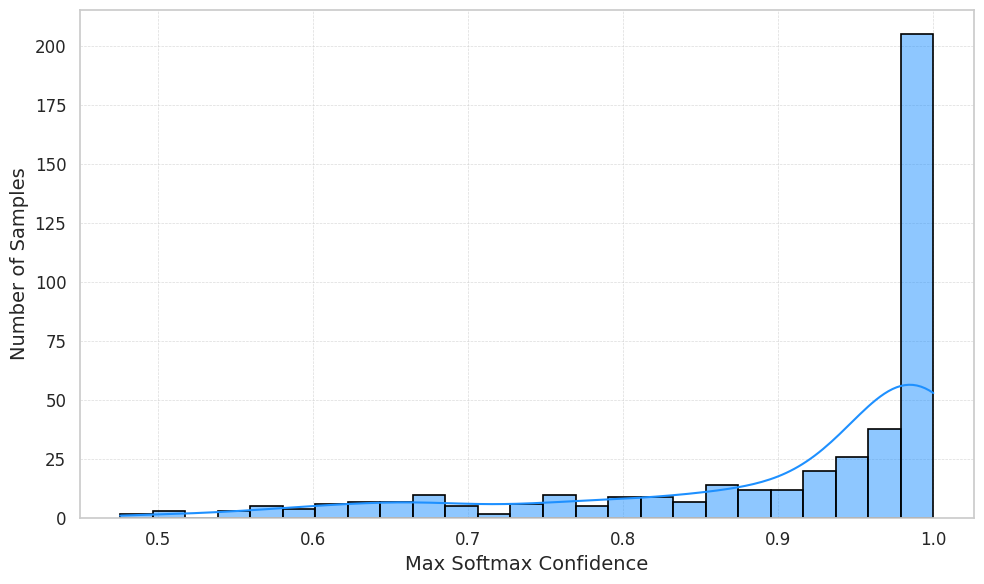

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn.functional as F

# Compute softmax probabilities and max confidence
probs = F.softmax(logits, dim=1).numpy()
max_confidences = probs.max(axis=1)

# Set plotting style
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Plot histogram with KDE
sns.histplot(max_confidences, bins=25, kde=True, color='dodgerblue', edgecolor='black', linewidth=1.2)

# Titles and labels
plt.title("", fontsize=16, weight='bold', pad=15)
plt.xlabel("Max Softmax Confidence", fontsize=14)
plt.ylabel("Number of Samples", fontsize=14)

# Customize ticks and grid
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Tight layout and show
plt.tight_layout()
plt.show()


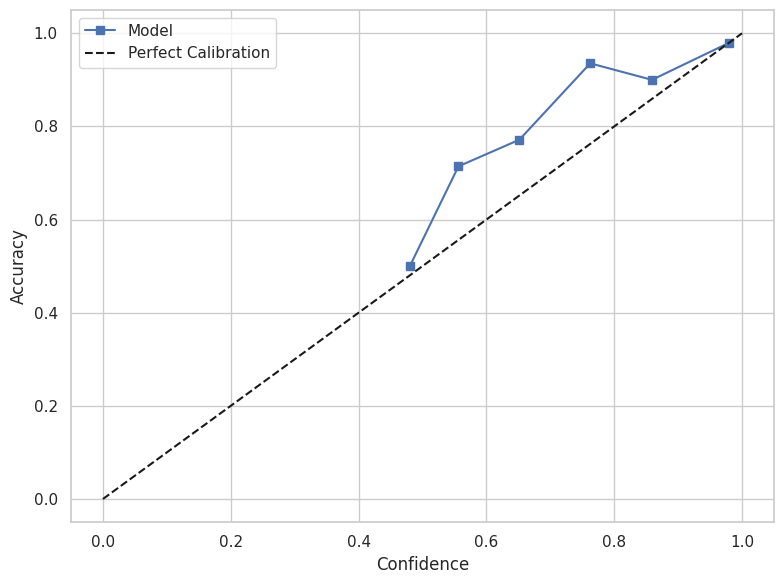

In [ ]:
import numpy as np
from sklearn.calibration import calibration_curve

# Convert tensors to numpy
probs = F.softmax(logits, dim=1).detach().cpu().numpy()
y_pred = np.argmax(probs, axis=1)
y_true = y_true.cpu().numpy() if torch.is_tensor(y_true) else y_true

max_confidences = probs.max(axis=1)
correct = (y_pred == y_true).astype(int)

# Compute calibration curve
fraction_of_positives, mean_predicted_value = calibration_curve(correct, max_confidences, n_bins=10)

# Plot reliability diagram
plt.figure(figsize=(8, 6))
plt.plot(mean_predicted_value, fraction_of_positives, "s-", label="Model")
plt.plot([0, 1], [0, 1], "k--", label="Perfect Calibration")
plt.xlabel("Confidence")
plt.ylabel("Accuracy")
plt.title("")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


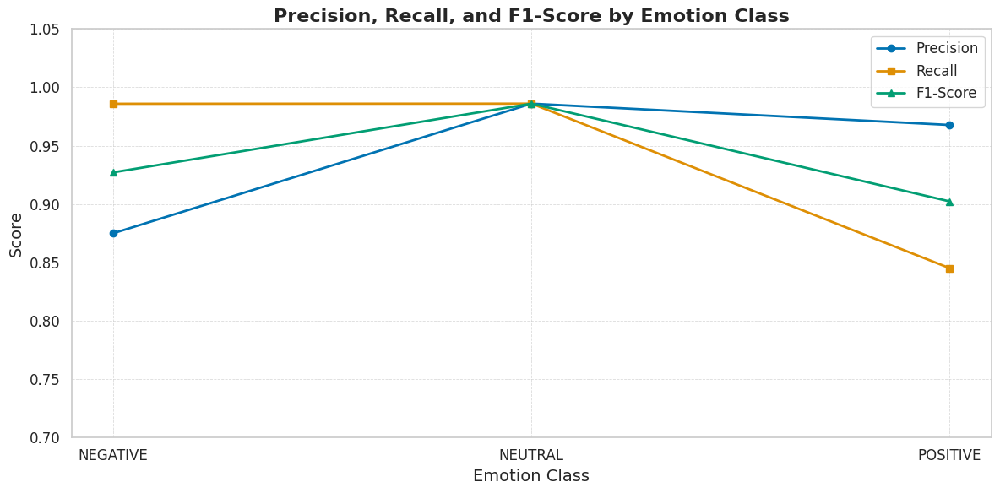

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# Setup Seaborn style
sns.set(style="whitegrid", context="notebook")

# Calculate classification report
report = classification_report(y_true, y_pred, target_names=label_encoder.classes_, output_dict=True)

# Extract metrics
classes = list(report.keys())[:-3] # Exclude 'accuracy', 'macro avg', 'weighted avg'
precision = [report[cls]["precision"] for cls in classes]
recall = [report[cls]["recall"] for cls in classes]
f1_score = [report[cls]["f1-score"] for cls in classes]

# Color palette
palette = sns.color_palette("colorblind")

# Modern Line Plot
plt.figure(figsize=(12, 6))
plt.plot(classes, precision, marker='o', linestyle='-', linewidth=2, label='Precision', color=palette[0])
plt.plot(classes, recall, marker='s', linestyle='-', linewidth=2, label='Recall', color=palette[1])
plt.plot(classes, f1_score, marker='^', linestyle='-', linewidth=2, label='F1-Score', color=palette[2])

plt.title("Precision, Recall, and F1-Score by Emotion Class", fontsize=16, weight='bold')
plt.ylabel("Score", fontsize=14)
plt.xlabel("Emotion Class", fontsize=14)
plt.ylim(0.7, 1.05)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(frameon=True, fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
plt.tight_layout()
plt.show()

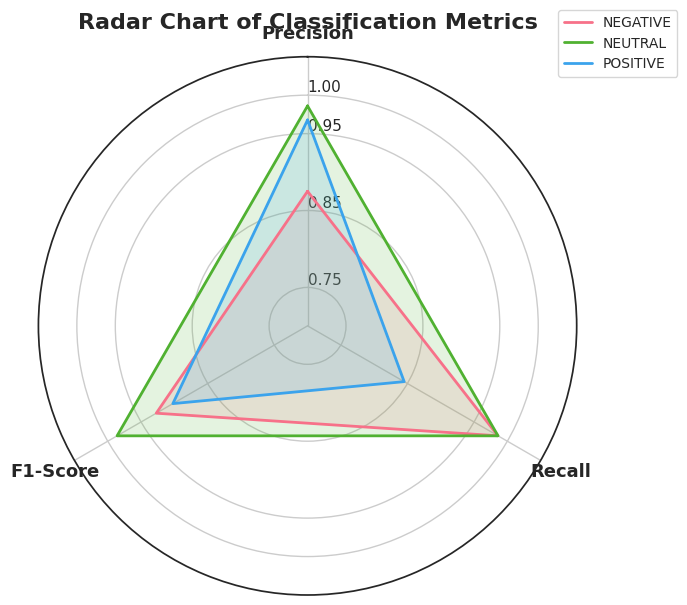

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

# Set theme
sns.set(style="white")

# Radar chart setup
labels = ['Precision', 'Recall', 'F1-Score']
num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # loop closure

# Prepare figure
fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))

# Color palette
colors = sns.color_palette("husl", len(classes))

# Plot each class
for i, cls in enumerate(classes):
    scores = [report[cls][m.lower()] for m in labels]
    scores += scores[:1]
    ax.plot(angles, scores, label=cls, color=colors[i], linewidth=2)
    ax.fill(angles, scores, color=colors[i], alpha=0.15)

# Style
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_rlabel_position(0)
ax.set_ylim(0.7, 1.05)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=13, weight='bold')
ax.set_yticks([0.75, 0.85, 0.95, 1.0])
ax.set_yticklabels(["0.75", "0.85", "0.95", "1.00"], fontsize=11)
ax.set_title("Radar Chart of Classification Metrics", fontsize=16, weight='bold', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1), fontsize=10)
plt.tight_layout()
plt.show()